<a href="https://colab.research.google.com/github/kteppris/RealWaste/blob/main/2_EDA_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**22.02.2024 (Flemming)**: \
Hier möchte ich die EDA mal ein wenig "ins Reine schreiben". \
Die Kommentare im Code ändere ich später nochmal, ich will erstmal die Inhalte haben und dass es funktioniert.

# Explorative Datenanalyse (EDA)

Der Begriff der Explorativen Datenanalyse (EDA) geht auf [Tukey (1962)](https://www.jstor.org/stable/i312810) zurück, der den Begriff der Datenanalyse wie folgt definierte:
\
\
_"Procedures for analyzing data, techniques for interpreting the results of such procedures, ways of planning the gathering of data to make its analysis easier, more precise or more accurate, and all the machinery and results of (mathematical) statistics which apply to analyzing data."_
\
\
Die EDA ziehlt demnach darauf ab, mit statistischen Methoden die wesentlichen Strukturen eines Datensatzes zu entdecken, Muster und Anomalien zu identifizieren und die weiteren Analysen durch die gewonnenen Einblicke zu leiten.

Das [DASC-PM v1.1](https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf) verortet die EDA in der Projektphase der _Datenbereitstellung_.
Als Ergebnis dieser Projektphase ensteht aus einer oder mehreren _Ursprungsdatenquellen_ eine _Analytische Datenquelle_, die im weiteren Projektverlauf zu Analysezwecken genutzt wird.

Um diese Analytische Datenquelle zu erzeugen, ist die Bearbeitung der Kernaufgaben _Datenaufbereitung_, _Datenmanagement_ und _Explorative Datenanalyse_ erforderlich.

Das DASC-PM v1.1 schreibt für die EDA keine feste Abfolge für anzuwenende Verfahren vor, da auch ihre Auswahl vom Untersuchungsgegenstand abhängig ist.

Beim Untersuchungsgegenstand dieser Ausarbeitung, dem [RealWaste-Datensatz](https://ieee-dataport.org/documents/realwaste#:~:text=RealWaste%20is%20an%20image%20dataset,facility%20in%20Wollongong%20NSW%20Australia.) handelt es sich wie in **Verweis** beschrieben um Bilddateien und somit um unstrukturierte, hochdimensionale Daten, die aus einer Vielzahl von Pixelwerten bestehen.

Die nachfolgende EDA zielt darauf ab, für den untersuchten Datensatz die Verteilung über die Klassen zu ermitteln und eine zufällige Auswahl von Bildern aus dem Datensatz einer ersten visuellen Inspektion zu unterziehen. \
Aus dieser Erstinspektion werden weitere Schritte im Rahmen der EDA zu weiterführenden Untersuchungen durch _Farbhistogramme_, _Local Binary Patterns (LBP)_ oder _Canny Edge Detection Filter_ abgeleitet. Diese weiterführenen Untersuchungen zielen darauf ab, Features aus den Bildern des RealWaste-Datensatzes zu extrahieren. \

Ziel der EDA ist es, die gewonnen Features mit klassischen ML-Methoden wie K-Nearest-Neigbors (KNN), Support Vector Machines (SVM) oder Random Forest für eine Klassifikation der Bilder einzusetzen.

Die zentralen Erkenntnisse der EDA werden in Form von Artefakten (Visualisierungen oder Modelle) festgehalten und Probleme bei der Datenqualität sowie Änderungen des Datenmaterials dokumentiert.

Für spätere Deep-Learning-Ansätze im Rahmen dieser Ausarbeitung stellen die vorangestellt im Rahmen der EDA verprobten klassischen Ansätze eine Benchmark dar.

***
**Quellen:**
* DASC-PM v1.1 \
https://info.nordakademie.de/hubfs/Website%20Relaunch%202022/Forschungsthemen/DASC-PM_v1.1.pdf
* Tukey, J. W. (1962). The Future of Data Analysis. The Annals of Mathematical Statistics, 33(1), 1–67. \
http://www.jstor.org/stable/2237638
* RealWaste-Datensatz \
https://ieee-dataport.org/documents/realwaste#:~:text=RealWaste%20is%20an%20image%20dataset,facility%20in%20Wollongong%20NSW%20Australia.

***

## Daten laden und vorverarbeiten

### Daten laden

In [18]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [19]:
import os

# Ändere den Pfad zu dem Ort, an dem sich Ihr RealWaste-Ordner befindet
# data_path = 'drive/mydrive/RealWaste'
%cd drive/MyDrive/RealWaste

# Überprüfe den aktuellen Arbeitsordner
print("Current Directory:", os.getcwd())

# Listet den Inhalte des Datenverzeichnisses auf und gibt die Namen der Klassen-Unterordner aus
print("Directory Contents:", os.listdir('.'))

[Errno 2] No such file or directory: 'drive/MyDrive/RealWaste'
/content/drive/MyDrive/MADS/RealWaste
Current Directory: /content/drive/My Drive/MADS/RealWaste
Directory Contents: ['.git', 'requirements.txt', 'PyTroch_lightning_inception_v3.ipynb', 'README.md', 'PyTorch_lightning_train.ipynb', 'LICENSE', '240217_FLR_RealWaste_EDA_und_RandomForestL.ipynb', '.gitignore', '1_Hauptnotebook.ipynb', 'Keno_test.ipynb', '3_DeepLearning.ipynb', 'FLR_Copy_of_PyTorch_lightning_train.ipynb', '240218_MADS2400_RealWaste.ipynb', '2_EDA_Notebook.ipynb', '240219_MADS2400_RealWaste.ipynb', '240216_FLR_RealWaste_EDA_und_klassische_ML.ipynb', '__init__.py', 'lightning_logs', 'RealWaste Eigene Bilder Resized', '240218_FLR_RealWaste_EDA_und_RandomForest_HOG_LBP.ipynb', '.devcontainer', 'realwaste', 'utils', 'data']


### Daten vorverarbeiten

Das Dictionary '**images_resized**' wird im Ergebnis der Vorverarbeitung erzeugt.

Alternativ hier für die Vorverarbeitung später den Code von Keno verwenden.

Über die Funktion _load_and_resize_images_ werden die Bilder des RealWaste-Datensatzes neu skaliert, um

In [1]:
import sys
import os
from pathlib import Path

# Funktion, die prüft, ob dieses Skript in Colab ausgeführt wird
def in_colab():
    # sys beinhaltet alle bereits geladenen Pakete
    return 'google.colab' in sys.modules  # google.colab wird automatisch in Colab vorgeladen, daher Indiz für Colab Environment

code_repo_path = Path("/content/drive/MyDrive/MADS/RealWaste") if in_colab() else Path.cwd()

if in_colab():
    # Google Drive einbinden zum persistieren von Code, Daten und Ergebnissen
    from google.colab import drive
    drive.mount('/content/drive')
    if not code_repo_path.exists():
        raise FileNotFoundError("Code und Datenordner konnte nicht gefunden werden. Bitte zuerst das Notebook '1_Hauptnotebook.ipynb' ausführen.")
    else:
        # wechsle Arbeitsverzeichnis zu code_repo_path
        %cd {code_repo_path}
        print(f"Wechsel Arbeitsverzeichnis zu {Path.cwd()}")
        %pip install -r requirements.txt
else:
    print("Stellen Sie sicher, dass das richtige Venv als Kernel ausgewählt ist,\nwelches wie in '1_Hauptnotebook.ipynb' beschrieben erstellt wurde.")

data_path = code_repo_path / "data"

Stellen Sie sicher, dass das richtige Venv als Kernel ausgewählt ist,
welches wie in '1_Hauptnotebook.ipynb' beschrieben erstellt wurde.


In [4]:
import os
from PIL import Image
import numpy as np

def load_and_resize_images(data_path, new_size): # Bilder neu skaliert mit dem Argument 'new_size(,)'
    images_resized = {}
    class_names = [d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d)) and not d.startswith('.')]  # Versteckte Ordner überspringen 

    for class_name in class_names:
        class_folder = os.path.join(data_path, class_name)
        image_files = [f for f in os.listdir(class_folder) if f.endswith('.jpg') and not f.startswith('.')]  # Nur .jpg Bilder verarbeiten
        images_resized[class_name] = []

        for image_file in image_files:
            img_path = os.path.join(class_folder, image_file)
            img = Image.open(img_path)
            img_resized = img.resize(new_size)
            images_resized[class_name].append(np.array(img_resized))

    return images_resized

# Neue Größe auf die Bilder aus meinem Ordner anwenden
images_resized = load_and_resize_images(data_path=data_path, new_size = (128, 128))

## Anzahl Bilder und Verteilung auf die Klassen

In [5]:
# Alle Klassenordner auflisten
classes = os.listdir(data_path)

# Erstelle ein Dictionary
images_per_class = {}

for class_name in classes:
    # Pfad zum Klassenordner
    class_path = os.path.join(data_path, class_name)

    # Alle Dateien in diesem Klassenordner auflisten
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]

    # Anzahl der Bilder in diesem Klassenordner zählen
    image_count = len(images)
    images_per_class[class_name] = image_count

# Ergebnisse ausgeben
for class_name, count in images_per_class.items():
    print(f"Class '{class_name}' beinhaltet {count} Bilder")

Class 'Vegetation' beinhaltet 436 Bilder
Class 'Textile Trash' beinhaltet 318 Bilder
Class 'Cardboard' beinhaltet 461 Bilder
Class 'Plastic' beinhaltet 921 Bilder
Class 'Miscellaneous Trash' beinhaltet 495 Bilder
Class 'Paper' beinhaltet 500 Bilder
Class 'Metal' beinhaltet 790 Bilder
Class 'Glass' beinhaltet 420 Bilder
Class 'Food Organics' beinhaltet 411 Bilder


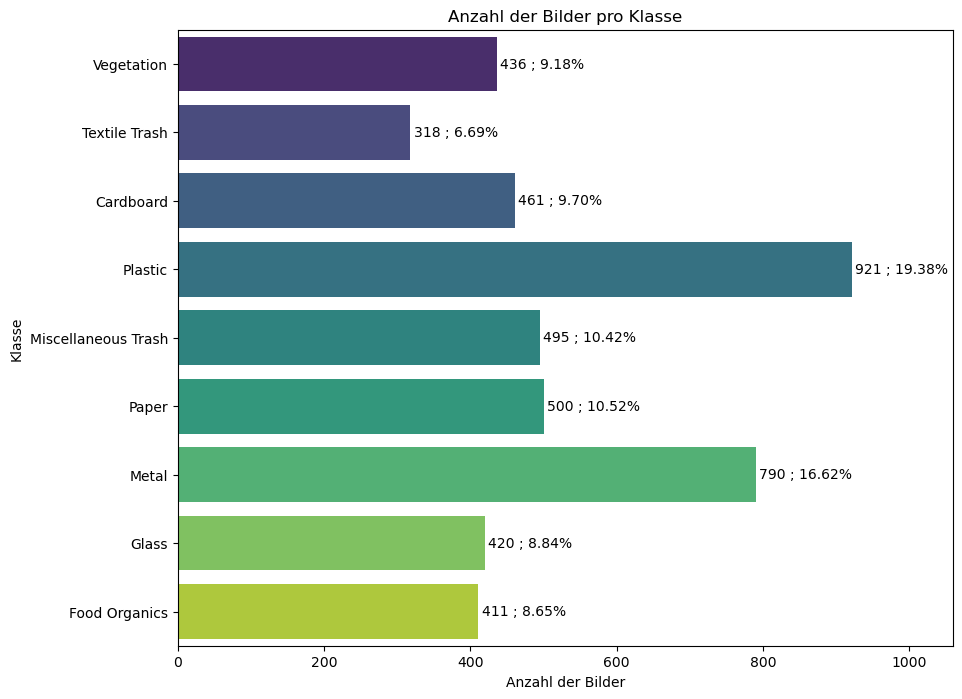

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


# Daten für das Balkendiagramm vorbereiten
class_names = list(images_per_class.keys())
image_counts = list(images_per_class.values())

# Gesamtanzahl der Bilder berechnen
total_images = sum(image_counts)

# Balkendiagramm erstellen
plt.figure(figsize=(10, 8))
sns.barplot(x=image_counts, y=class_names, palette="viridis")
plt.title('Anzahl der Bilder pro Klasse')
plt.xlabel('Anzahl der Bilder')
plt.ylabel('Klasse')

# Rechten Rand für Textbeschriftungen erhöhen
plt.xlim(0, max(image_counts) * 1.15)  # 15% mehr Platz für Beschriftungen

# Beschriftungen mit Prozentangabe hinzufügen
for index, value in enumerate(image_counts):
    percentage = (value / total_images) * 100  # Prozentualen Anteil berechnen
    plt.text(value + max(image_counts) * 0.005, index, f"{value} ; {percentage:.2f}%", va='center')  # Etwas Puffer hinzufügen, damit die Beschriftung ins Diagramm passt

plt.show()

## Beispielbilder anzeigen

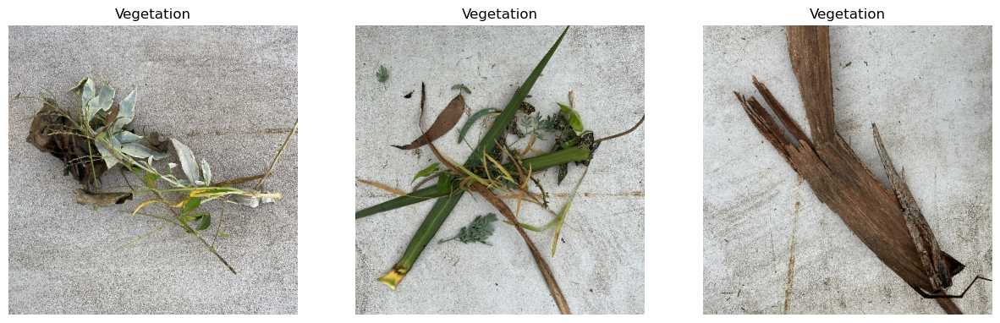

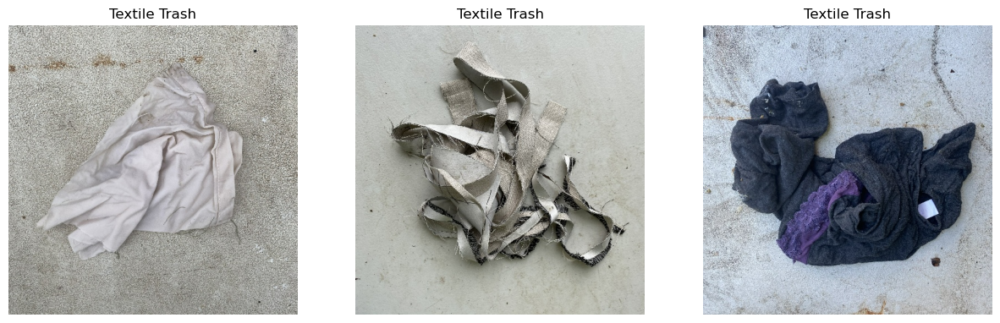

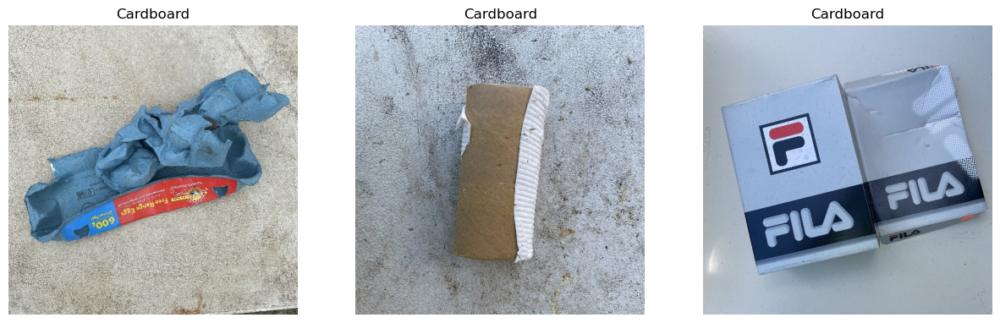

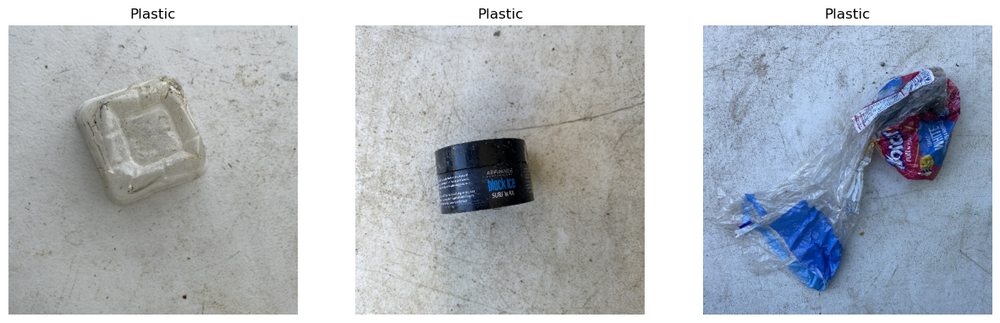

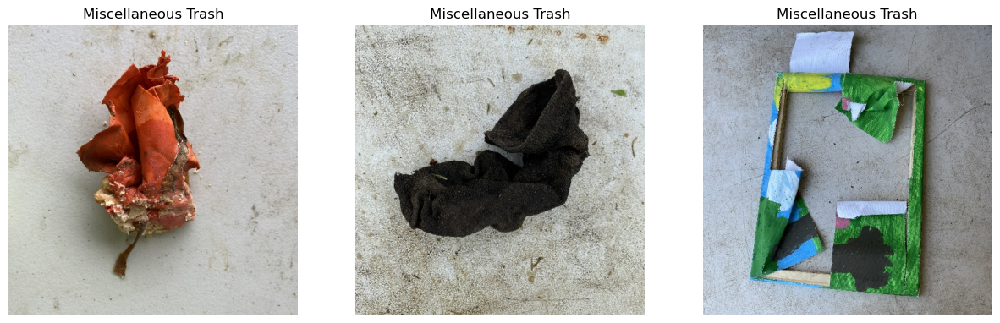

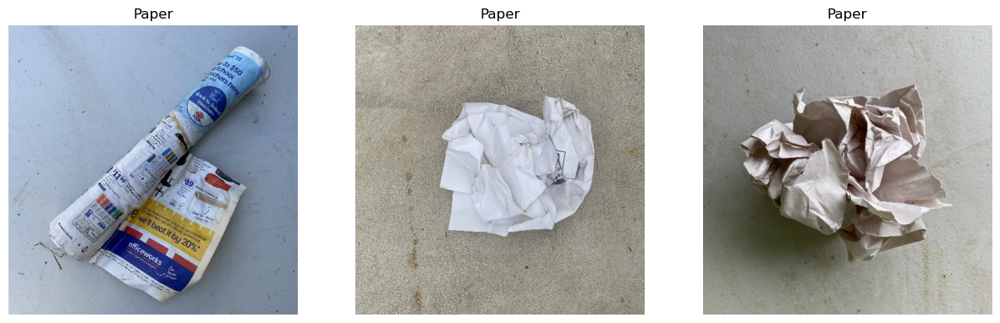

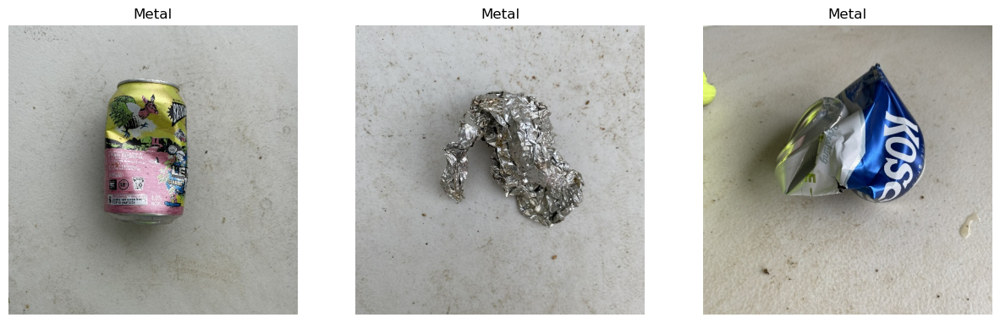

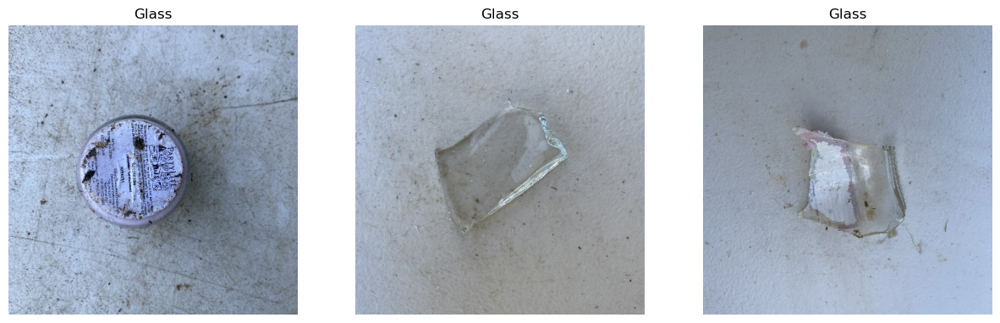

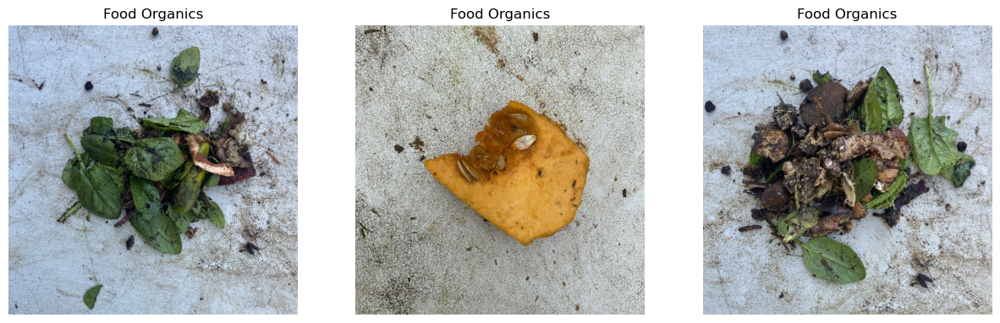

In [8]:
import random
from PIL import Image

# 'class_names' enthält die Namen aller Klassen
for class_name in class_names:
    # Pfad zum Klassenordner
    class_folder = os.path.join(data_path, class_name)

    # Liste aller Bilddateien in diesem Ordner
    image_files = os.listdir(class_folder)

    # Wähle zufällige Bilder
    selected_images = random.sample(image_files, 3)

    # Zeige diese Bilder an
    plt.figure(figsize=(15, 5))
    for i, image_file in enumerate(selected_images):
        img_path = os.path.join(class_folder, image_file)
        img = Image.open(img_path)
        plt.subplot(1, 3, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    plt.show()


## Dimensionaliätsreduktion / PCA

### PCA mit 2 Dimensionen

In [9]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Erstelle eine Matrix mit allen Bildern, flachgedrückt zu Vektoren
# wir beziehen uns dabei auf 'images_resized'
image_matrix = np.array([img.flatten() for class_images in images_resized.values() for img in class_images])

# Skaliere die Daten, um einen Mittelwert von 0 und eine Standardabweichung von 1 zu haben
scaler = StandardScaler()
image_matrix_scaled = scaler.fit_transform(image_matrix)

# Wende PCA an
pca = PCA(n_components=2)  # Reduziere beispielsweise auf 2 Dimensionen
principal_components_2d = pca.fit_transform(image_matrix_scaled) # `principal_components_2d` enthält jetzt die transformierten Daten


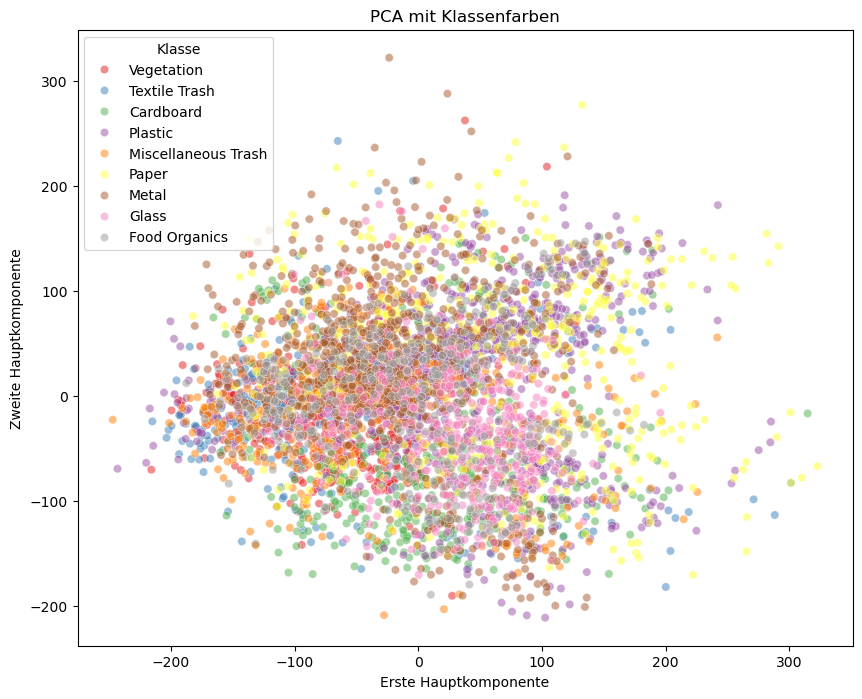

In [10]:
import seaborn as sns
import pandas as pd

# Erstelle einen DataFrame für die Principal Components
df = pd.DataFrame(principal_components_2d, columns=['PC1', 'PC2'])

# Füge die Klassennamen hinzu. Angenommen, du hast eine Liste von Klassennamen,
# die der Reihenfolge der Bilder in `image_matrix` entsprechen.
class_labels = []
for class_name, images in images_resized.items():
    class_labels.extend([class_name] * len(images))
df['Klasse'] = class_labels

# Erstelle das Scatterplot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df, x='PC1', y='PC2', hue='Klasse', palette='Set1', alpha=0.5)
plt.title('PCA mit Klassenfarben')
plt.xlabel('Erste Hauptkomponente')
plt.ylabel('Zweite Hauptkomponente')
plt.legend(title='Klasse')
plt.show()



### PCA mit 3 Dimensionen

In [11]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Erstelle eine Matrix mit allen Bildern, flachgedrückt zu Vektoren
# wir beziehen uns auf 'images_resized'
image_matrix = np.array([img.flatten() for class_images in images_resized.values() for img in class_images])

# Skaliere die Daten, um einen Mittelwert von 0 und eine Standardabweichung von 1 zu haben
scaler = StandardScaler()
image_matrix_scaled = scaler.fit_transform(image_matrix)

# Wende PCA an
pca = PCA(n_components=3)  # Reduziere auf 3 Dimensionen
principal_components_3d = pca.fit_transform(image_matrix_scaled) # `principal_components_3d` enthält jetzt die transformierten Daten

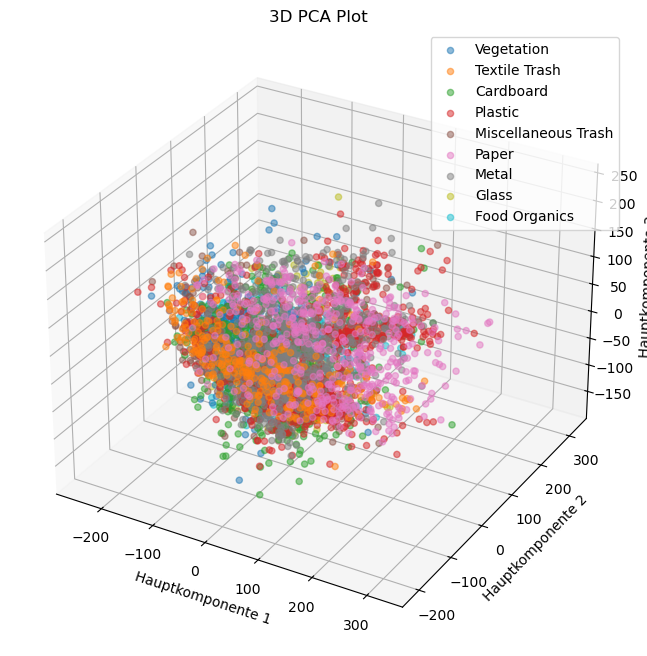

In [12]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Erzeuge eine Farbkarte basierend auf den Klassenlabels
colors = plt.cm.tab10(np.linspace(0, 1, len(class_names)))

# Scatterplot für jede Klasse
for class_name, color in zip(class_names, colors):
    # Wähle die Datenpunkte aus, die zur aktuellen Klasse gehören
    indices = [i for i, label in enumerate(class_labels) if label == class_name]
    ax.scatter(
        principal_components_3d[indices, 0],  # x-Werte
        principal_components_3d[indices, 1],  # y-Werte
        principal_components_3d[indices, 2],  # z-Werte
        label=class_name,
        color=color,
        alpha=0.5
    )

ax.set_xlabel('Hauptkomponente 1')
ax.set_ylabel('Hauptkomponente 2')
ax.set_zlabel('Hauptkomponente 3')
plt.title('3D PCA Plot')
plt.legend()
plt.show()


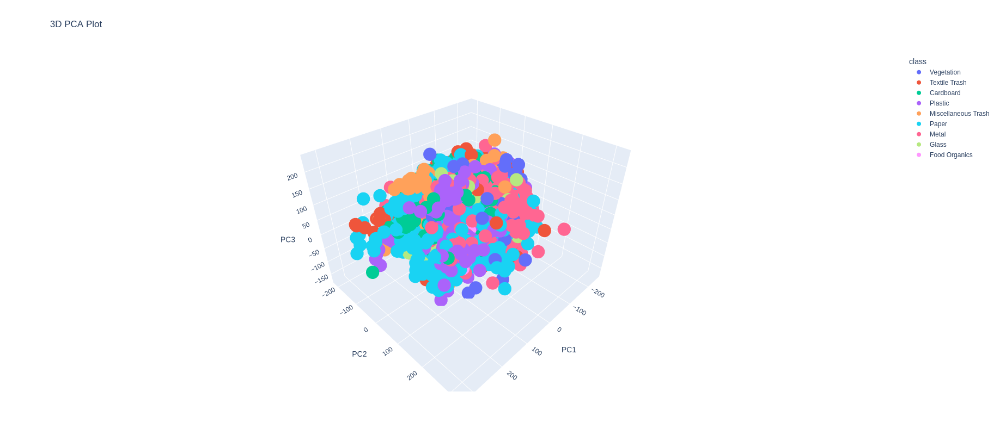

In [13]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(principal_components_3d, columns=['PC1', 'PC2', 'PC3'])
df['class'] = class_labels  # Stelle sicher, dass class_labels die richtigen Klassenlabels sind

# Erstelle ein 3D-Scatterplot-Diagramm
fig = px.scatter_3d(df, x='PC1', y='PC2', z='PC3',
                    color='class',  # Definiert die Farbkodierung
                    title="3D PCA Plot")

# Update die Layout-Einstellungen, um die Größe des Plots zu ändern
fig.update_layout(width=1000, height=800)

fig.show()


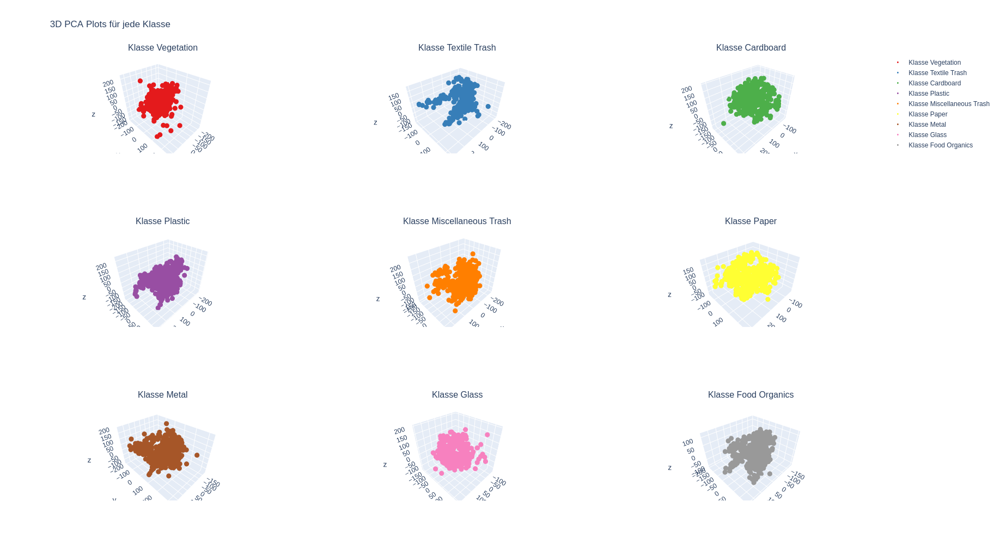

In [14]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Eindeutige Klassenlabels
unique_labels = df['class'].unique()

# Erstelle ein Subplot-Grid
fig = make_subplots(
    rows=3, cols=3,
    specs=[[{'type': 'scatter3d'} for _ in range(3)] for _ in range(3)],
    subplot_titles=[f'Klasse {label}' for label in unique_labels]
)

# Farbpalette festlegen
set1_palette = px.colors.qualitative.Set1

# Füge für jede Klasse einen 3D-Scatterplot hinzu
for i, label in enumerate(unique_labels):
    class_df = df[df['class'] == label]
    trace = go.Scatter3d(
        x=class_df['PC1'], y=class_df['PC2'], z=class_df['PC3'],
        mode='markers',
        marker=dict(
            size=3,
            color=set1_palette[i % len(set1_palette)],  # Farbe für die Klasse
        ),
        name=f'Klasse {label}'
    )
    fig.add_trace(trace, row=i//3+1, col=i%3+1)

# Update die Layout-Einstellungen für Plotgröße
fig.update_layout(height=900, width=900, title_text="3D PCA Plots für jede Klasse")

# Update die Layout-Einstellungen für jedes Subplot
for i in range(1, 10):
    fig.update_scenes(
        dict(
            camera=dict(
                eye=dict(x=1.25, y=1.25, z=1.25)
            )
        ),
        row=(i-1)//3+1,
        col=(i-1)%3+1
    )
fig.update_layout(width=1000, height=1000)

fig.show()


## Feature Engineering

* Farbhistogramme
* Konturen / Kanten mit Sobel-Filter

### Farbhistogramme --> Feature extrahieren

Farbhistogramme geben an, wie oft eine jede Farbe in einem Bild vorkommt. Das kann ein nützliches Feature sein, wenn die Farbe ein unterscheidendes Merkmal zwischen den Klassen ist. Die Histogramme müssen normalisiert werden, um als Features verwendet werden zu können.

Die Funktion **extract_color_features** gibt zwei Numpy-Arrays zurück: **feature_array** enthält die Feature-Vektoren und labels_array enthält die entsprechenden Klassenbezeichnungen. Diese Arrays werden dann für das Training der Klassifikationsmodelle verwendet.

In [15]:
# Dieser Code extrahiert das Farbhistogramm in normalisierter Form als Feature für jedes Bild aus den vorverarbeiteten Daten (images_resized)

def extract_color_features(images, bins=256, channel_range=(0, 256)):
    # Initialisiere eine Liste für Features und eine für Labels
    feature_list = []
    labels_list = []

    # Loope durch die Klassen des Datensets
    for class_name, imgs in images.items():
        # verarbeite jedes Bild in den Klassen
        for img in imgs:
            # Berechne ein Histogramm für jeden Farbkanal (RBG)
            hist_features_color = []
            for i in range(3):  # RGB
                hist = np.histogram(img[:, :, i], bins=bins, range=channel_range)[0]
                hist = hist / hist.sum()  # Histogramm normalisieren
                hist_features_color.extend(hist)

            # Die o.g. Listen feature_list und labels_list füllen
            feature_list.append(hist_features_color)
            labels_list.append(class_name)

    # Konvertieren der Listen in Numpy-Arrays
    feature_array_colorhist = np.array(feature_list)
    label_array_colorhist = np.array(labels_list)

    return feature_array_colorhist, label_array_colorhist

# Die nachfolgende Zeile extrahiert die features (--> Farbhistogramm) und labels aus den geladenen Bildern
feature_array_colorhist, label_array_colorhist = extract_color_features(images_resized)

Das neu erstellte Dictionary **color_histograms** ist ähnlich strukturiert wie _images_resized_, aber es enthält die Farbhistogramme der Bilder. Jedes Farbhistogramm ist hierbei ein flaches Array, das die normalisierte Anzahl von Pixeln in jedem Bin über alle drei Farbkanäle hinweg darstellt.

### Edges mit Sobel-Filter als Feature extrahieren

25.02.2024 Sobel Filter

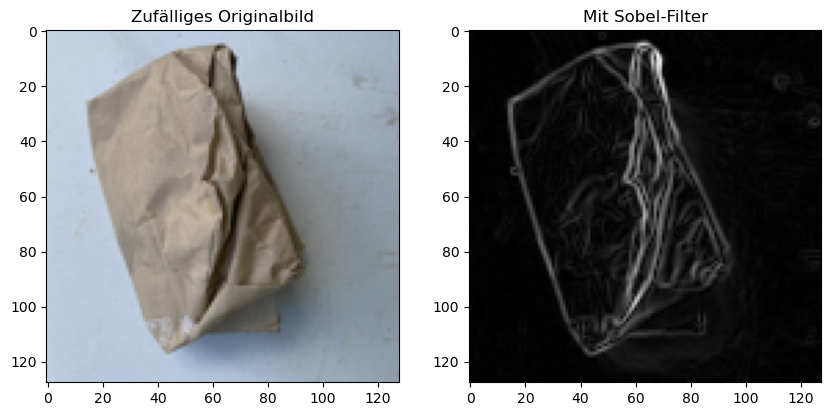

In [16]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt
import random

def apply_sobel_filter(image):
    """Wendet den Sobel-Filter auf ein Bild an und gibt das Ergebnis zurück."""
    # Konvertiere das Bild für den Sobel-Filter zuerst in Graustufen
    if image.ndim == 3 and image.shape[2] == 3:
        image_gray = np.mean(image, axis=2)
    else:
        image_gray = image
    image_gray = image_gray.astype(np.float32)

    sobel_x = ndimage.sobel(image_gray, axis=0)  # Sobel-Filter in x-Richtung
    sobel_y = ndimage.sobel(image_gray, axis=1)  # Sobel-Filter in y-Richtung

    # Berechne die Magnitude der Kanten
    sobel_magnitude = np.hypot(sobel_x, sobel_y)

    # Optional: Normalisiere das Ergebnis für die Anzeige
    sobel_magnitude = sobel_magnitude / np.max(sobel_magnitude)

    return sobel_magnitude

# Wähle zufällig eine Klasse und ein Bild aus dieser Klasse
random_class_name = random.choice(list(images_resized.keys()))
random_image = random.choice(images_resized[random_class_name])

# Wende den Sobel-Filter an, der das Bild automatisch zu Graustufen konvertiert
sobel_filtered_image = apply_sobel_filter(random_image)

# Zeige das Originalbild in seiner ursprünglichen Farbform und das gefilterte Bild in Graustufen
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
if random_image.ndim == 3:
    plt.imshow(random_image.astype(np.uint8))  # Stelle sicher, dass wir uint8 für Farbbilder verwenden
else:
    plt.imshow(random_image, cmap='gray')  # Für den Fall, dass das Bild bereits in Graustufen ist
plt.title('Zufälliges Originalbild')

plt.subplot(1, 2, 2)
plt.imshow(sobel_filtered_image, cmap='gray')
plt.title('Mit Sobel-Filter')

plt.show()


In [17]:
def extrahiere_sobel_features_neu(images_resized):
    features_edge = []  # Liste für die flachen Feature-Vektoren
    labels_edge = []  # Liste für die Labels

    for class_name, images in images_resized.items():
        for image in images:
            # Wende den Sobel-Filter auf das Bild an
            sobel_filtered_image = apply_sobel_filter(image)

            # Konvertiere das gefilterte Bild in einen flachen Vektor und füge ihn zu features_edge hinzu
            features_edge.append(sobel_filtered_image.flatten())

            # Füge das entsprechende Label zu labels_edge hinzu
            labels_edge.append(class_name)

    # Konvertiere Listen in NumPy-Arrays
    feature_array_edge_neu = np.array(features_edge)
    labels_array_edge_neu = np.array(labels_edge)

    return feature_array_edge_neu, labels_array_edge_neu


In [18]:
feature_array_edge_neu, labels_array_edge_neu = extrahiere_sobel_features_neu(images_resized)

Ende 25.02.2024 Sobel-Filter

## Weiterführende Untersuchungen (noch in Arbeit)


### Pixel-Intensitätsverteilung

**Ziele** der Untersuchung der Pixelintensitätsverteilung:
* Wie unterscheiden sich die Klassen in Helligkeit und Kontrast?
* Vorverarbeitung: Hilft bei der Entscheidung, ob ich eine Normierung oder Standardisierung der Pixelwerte vor dem Modelltraining durchführen sollte
* Anomalien erkennen


Pixelintensitätsverteilung auf die **SW-Bilder** über alle Klassen anwenden.:

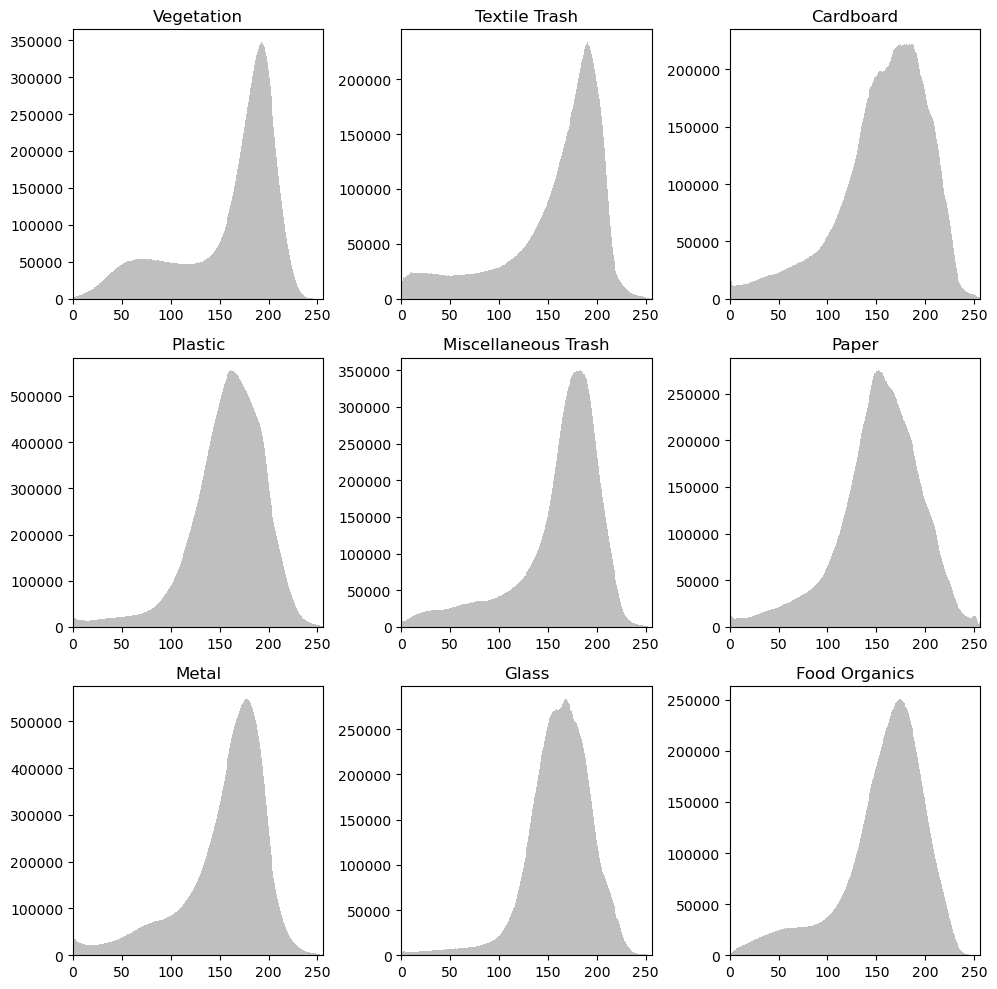

In [19]:
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3x3 Matrix von Subplots

axes = axes.ravel()  # Flacht die Achsen-Matrix in eine Liste ab

for i, class_name in enumerate(class_names):
    all_pixels = []
    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img_array in images_resized[class_name]:
        all_pixels.extend(img_array.ravel())

    # Erstelle ein aggregiertes Histogramm für die gesamte Klasse
    axes[i].hist(all_pixels, bins=256, range=[0,256], color='gray', alpha=0.5)
    axes[i].set_title(class_name)
    axes[i].set_xlim([0, 256])

plt.tight_layout()
plt.show()


Pixelintensitätsverteilung auf die **Farb-Bilder** über alle Klassen anwenden:

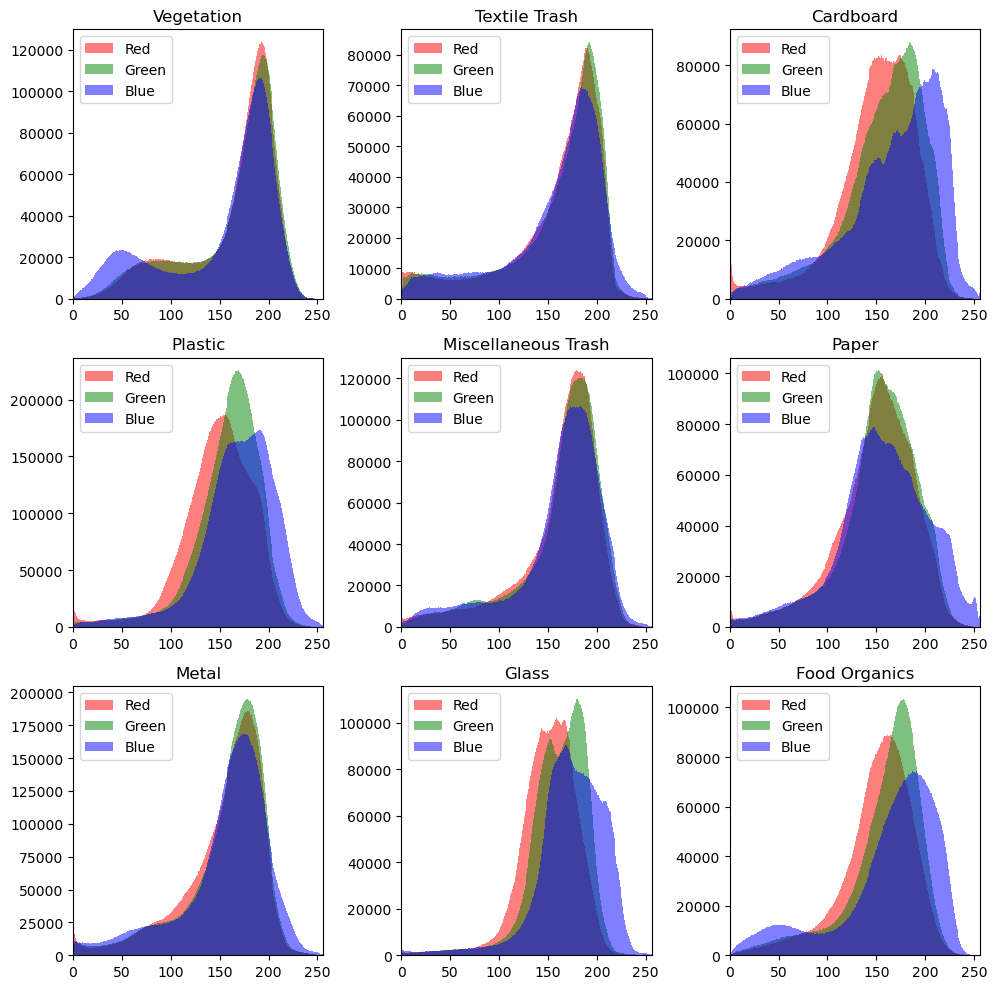

In [20]:
import matplotlib.pyplot as plt
import numpy as np

# Angenommen, `class_names` ist definiert und `images_resized` enthält die Bilder in Farbe
fig, axes = plt.subplots(3, 3, figsize=(10, 10))  # 3x3 Matrix von Subplots

axes = axes.ravel()  # Flacht die Achsen-Matrix in eine Liste ab

for i, class_name in enumerate(class_names):
    # Initialisiere Listen für die Pixelintensitäten der Kanäle
    pixels_r = []
    pixels_g = []
    pixels_b = []

    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img in images_resized[class_name]:
        pixels_r.extend(img[:, :, 0].ravel())
        pixels_g.extend(img[:, :, 1].ravel())
        pixels_b.extend(img[:, :, 2].ravel())

    # Erstelle ein Histogramm für die RGB-Kanäle
    axes[i].hist(pixels_r, bins=256, range=[0,256], color='red', alpha=0.5, label='Red')
    axes[i].hist(pixels_g, bins=256, range=[0,256], color='green', alpha=0.5, label='Green')
    axes[i].hist(pixels_b, bins=256, range=[0,256], color='blue', alpha=0.5, label='Blue')

    axes[i].set_title(class_name)
    axes[i].set_xlim([0, 256])
    axes[i].legend()

plt.tight_layout()
plt.show()


Gib mir für jede Klasse der **Farbbilder** den **Median, den Durchschnitt und die Standardabweichung für RBG** aus.

In [21]:
import numpy as np

# Angenommen, `class_names` ist definiert und `images_resized` enthält die RGB-Bilder
statistics = {}

for class_name in class_names:
    # Initialisiere Listen für die Pixelintensitäten der Kanäle
    pixels_r = []
    pixels_g = []
    pixels_b = []

    # Sammle Pixel-Intensitäten für alle vorverarbeiteten Bilder der Klasse
    for img in images_resized[class_name]:
        pixels_r.extend(img[:, :, 0].ravel())
        pixels_g.extend(img[:, :, 1].ravel())
        pixels_b.extend(img[:, :, 2].ravel())

    # Berechne Statistiken für jeden Kanal
    statistics[class_name] = {
        'median': {
            'red': np.median(pixels_r),
            'green': np.median(pixels_g),
            'blue': np.median(pixels_b)
        },
        'mean': {
            'red': np.mean(pixels_r),
            'green': np.mean(pixels_g),
            'blue': np.mean(pixels_b)
        },
        'std_dev': {
            'red': np.std(pixels_r),
            'green': np.std(pixels_g),
            'blue': np.std(pixels_b)
        }
    }

# Ausgabe der berechneten Statistiken
for class_name, stats in statistics.items():
    print(f"Klasse: {class_name}")
    for stat_name, channels in stats.items():
        print(f"  {stat_name.capitalize()}:")
        for channel, value in channels.items():
            print(f"    {channel.capitalize()}: {value:.2f}")
    print()


Klasse: Vegetation
  Median:
    Red: 180.00
    Green: 180.00
    Blue: 175.00
  Mean:
    Red: 163.06
    Green: 163.13
    Blue: 152.37
  Std_dev:
    Red: 46.49
    Green: 47.85
    Blue: 57.20

Klasse: Textile Trash
  Median:
    Red: 173.00
    Green: 175.00
    Blue: 172.00
  Mean:
    Red: 156.09
    Green: 157.16
    Blue: 156.16
  Std_dev:
    Red: 51.20
    Green: 52.00
    Blue: 51.90

Klasse: Cardboard
  Median:
    Red: 155.00
    Green: 165.00
    Blue: 176.00
  Mean:
    Red: 149.12
    Green: 156.25
    Blue: 164.48
  Std_dev:
    Red: 41.09
    Green: 43.13
    Blue: 51.28

Klasse: Plastic
  Median:
    Red: 151.00
    Green: 163.00
    Blue: 173.00
  Mean:
    Red: 147.68
    Green: 157.91
    Blue: 167.93
  Std_dev:
    Red: 36.09
    Green: 34.28
    Blue: 39.05

Klasse: Miscellaneous Trash
  Median:
    Red: 171.00
    Green: 173.00
    Blue: 171.00
  Mean:
    Red: 159.98
    Green: 161.92
    Blue: 160.47
  Std_dev:
    Red: 42.93
    Green: 43.58
    Blue: 46.2

# Klassische ML-Modelle

## Extrahierte Features gemeinsam laden

* Farbhistogramme
* Edges

In [22]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# Kombiniere die Feature-Vektoren
combined_features = np.hstack((feature_array_edge_neu, feature_array_colorhist))

In [23]:
# prüfen, ob combined_features_colorhist_edge Werte enthält
print(combined_features_colorhist_edge)  # Gibt die Dimension des Arrays aus


NameError: name 'combined_features_colorhist_edge' is not defined

* **KNN** (k-Nearest Neighbors): Einfach zu implementieren und zu verstehen, aber möglicherweise nicht die effizienteste Wahl bei großen Datensätzen.
* **SVM** (Support Vector Machine): Sehr effektiv in hochdimensionalen Räumen und wenn es eine klare Trennbarkeit der Klassen gibt, kann aber bei größeren Datensätzen rechenintensiv sein.
* **Random Forest**: Effektiv für eine Vielzahl von Daten, robust gegenüber Overfitting und kann die Wichtigkeit von Features anzeigen, kann aber bei sehr großen Datenmengen langsam sein.

## Aufteilung Trainings- und Testdatensatz

### Combined Features

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Angenommen, combined_features ist deine kombinierte Feature-Matrix
# und labels sind deine Labels

# Teile die Daten in Trainings- und Testsets auf
X_train, X_test, y_train, y_test = train_test_split(combined_features, labels, test_size=0.2, random_state=42)

# Initialisiere den StandardScaler
scaler = StandardScaler()

# Fitte den Skalierer nur auf die Trainingsdaten
scaler.fit(X_train)

# Wende die Skalierung auf die Trainings- und Testdaten an
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# KNN-Modell initialisieren und trainieren
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_scaled, y_train)

# Modell bewerten
y_pred_knn = knn.predict(X_test_scaled)
print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))

### Features Farbhistogramme

In [ ]:
# Hier nur für die Farbhistogramme

from sklearn.model_selection import train_test_split

# Aufteilen der Daten in Trainings- und Testsets
X_train, X_test, y_train, y_test = train_test_split(
    feature_array_colorhist, label_array_colorhist, test_size=0.2, random_state=42) # Ich verwende den 'label_array' aus dem Color-Feature. Da es nur um das Label geht, könnte ich hier prinziell jedes Label nehmen.
# Flemming: Diesen Code passe ich später nochmal an, sodass nicht nur 20%, sondern 20% jeder Klasse als Testmenge verwendet werden.

### Features Edge/Sobel

In [ ]:
from sklearn.model_selection import train_test_split

# Teile die Daten in Trainings- und Testsets auf
X_train, X_test, y_train, y_test = train_test_split(feature_array_edge_neu, labels_array_edge_neu, test_size=0.2, random_state=42)

## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# KNN-Modell initialisieren und trainieren
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

# Modell bewerten
y_pred_knn = knn.predict(X_test)
print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))

## Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# RF initialisieren und trainieren

rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Modellbewertung
y_pred_rf = rf.predict(X_test)
print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))

## SVM

In [ ]:
from sklearn.svm import SVC

# SVM-Modell initialisieren und trainieren
svm = SVC(kernel='linear')  # 'linear', 'poly', 'rbf', 'sigmoid'
svm.fit(X_train, y_train)

# Modell bewerten
y_pred_svm = svm.predict(X_test)
print("SVM Classification Report:")
print(classification_report(y_test, y_pred_svm))


# (Noch) nicht verwendet

### Canny Edge Detection --> Feature extrahieren (funktioniert noch nicht)

In [ ]:
import cv2
from matplotlib import pyplot as plt

def apply_canny_edge_detection(images_resized, lower_threshold=100, upper_threshold=200):
    """
    Wendet Canny Edge Detection auf jedes Bild im images_resized Dictionary an.
    Die Schwellenwerte können angepasst werden, um die Empfindlichkeit der Kantenentdeckung zu steuern.

    Args:
    images_resized (dict): Ein Dictionary mit Klassennamen als Schlüssel und Listen von Bildern als Werte.
    lower_threshold (int): Der untere Schwellenwert für den Canny-Algorithmus.
    upper_threshold (int): Der obere Schwellenwert für den Canny-Algorithmus.

    Returns:
    dict: Ein Dictionary mit denselben Schlüsseln wie images_resized, aber die Bilder sind jetzt Kantenbilder.
    """
    images_canny = {}
    for class_name, images in images_resized.items():
        images_canny[class_name] = []
        for image in images:
            # Konvertiere das Bild in Graustufen, da Canny nur auf Ein-Kanal-Bilder angewendet wird
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            # Wende Canny Edge Detection an
            edges = cv2.Canny(gray_image, lower_threshold, upper_threshold)
            images_canny[class_name].append(edges)

    return images_canny

# Beispiel für die Anwendung von Canny Edge Detection
images_canny = apply_canny_edge_detection(images_resized)

# Optional: Anzeigen eines Bildes vor und nach der Anwendung von Canny Edge Detection
# Wählen Sie eine Klasse und ein Bildindex zum Anzeigen aus
class_name = list(images_canny.keys())[0]  # Erste Klasse auswählen
image_index = 0  # Erstes Bild auswählen

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(images_resized[class_name][image_index], cmap='gray')
plt.title('Original Image')
plt.subplot(1, 2, 2)
plt.imshow(images_canny[class_name][image_index], cmap='gray')
plt.title('Canny Edge Image')
plt.show()


In [ ]:
# Überprüfen Sie die Anzahl der Klassen und Bilder pro Klasse
for class_name, images in images_canny.items():
    print(f"Klasse: {class_name}, Anzahl der Bilder: {len(images)}")

# Versuchen Sie, ein Bild zu plotten, wenn vorhanden
if images_canny:  # Überprüfen Sie, ob das Dictionary nicht leer ist
    class_name = list(images_canny.keys())[0]  # Erste Klasse auswählen
    if images_canny[class_name]:  # Überprüfen Sie, ob Bilder in der Klasse vorhanden sind
        image_index = 0  # Erstes Bild auswählen
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(images_resized[class_name][image_index], cmap='gray')
        plt.title('Original Image')
        plt.subplot(1, 2, 2)
        plt.imshow(images_canny[class_name][image_index], cmap='gray')
        plt.title('Canny Edge Image')
        plt.show()
    else:
        print(f"Keine Bilder in der Klasse {class_name} gefunden.")
else:
    print("Das Dictionary images_canny ist leer.")


#### Local Binary Patterns

In [ ]:
from skimage.feature import local_binary_pattern
import numpy as np

def compute_lbp_histogram(image, P, R, method='uniform'):
    """
    Berechnet das LBP (Local Binary Pattern) für ein Bild und erstellt ein Histogramm der LBP-Werte.

    :param image: Einzelnes Bild als numpy array.
    :param P: Anzahl der kreisförmigen Nachbarn für LBP.
    :param R: Radius für kreisförmige Nachbarn in LBP.
    :param method: Methode zur Berechnung des LBP.
    :return: Histogramm der LBP-Werte.
    """
    # Berechne LBP für das Bild
    lbp_image = local_binary_pattern(image, P, R, method)

    # Erstelle ein Histogramm der LBP-Werte
    # Für 'uniform' LBP werden (P+2) Bins verwendet, da es P+1 uniforme Muster gibt plus 1 Bin für nicht-uniforme Muster
    n_bins = int(lbp_image.max() + 1)
    histogram, _ = np.histogram(lbp_image.ravel(), density=True, bins=n_bins, range=(0, n_bins))

    return lbp_features

# Beispiel für die Anwendung dieser Funktion:
# Angenommen, Sie haben ein Graustufenbild 'image'
# histogram = compute_lbp_histogram(image, P=8, R=1)
